In [47]:
from google.colab import drive
drive.mount('/content/drive')

# Then load it directly from Drive
file_path = "/content/drive/MyDrive/Capstone/manhattan_details.json"

import json
with open(file_path, "r") as f:
    data = json.load(f)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Data Transformation and Feature Engineering

In [48]:
import pandas as pd

# wrap multiple listings in a list
if isinstance(data, dict):
    data = [data]


# Flatten using pandas.json_normalize
df = pd.json_normalize(
    data,
    sep='_',
    errors='ignore'
)

keep_cols = [
    'id', 'status', 'listedAt', 'closedAt', 'daysOnMarket', 'availableFrom',
    'address', 'price', 'borough', 'neighborhood', 'zipcode',
    'propertyType', 'sqft', 'bedrooms', 'bathrooms', 'type',
    'latitude', 'longitude', 'builtIn', 'noFee', 'description',
    'amenities', 'building.id', 'subways'
]

df = df[[c for c in keep_cols if c in df.columns]]

# Building ID
df.rename(columns={'building.id': 'building_id'}, inplace=True)

# Convert amenities list to a comma-separated string
df['amenities'] = df['amenities'].apply(lambda x: ', '.join(x) if isinstance(x, list) else '')

# Summarize subways info (count, min distance, unique routes)
def process_subways(subways):
    if not isinstance(subways, list) or len(subways) == 0:
        return pd.Series({'num_subways': 0, 'nearest_subway_distance': None, 'subway_routes': ''})
    distances = []
    all_routes = []
    for s in subways:
        try:
            if 'distance' in s:
                distances.append(float(s['distance']))
            if 'routes' in s:
                all_routes.extend(s['routes'])
        except Exception:
            continue
    return pd.Series({
        'num_subways': len(subways),
        'nearest_subway_distance': min(distances) if distances else None,
        'subway_routes': ', '.join(sorted(set(all_routes)))
    })

subway_features = df['subways'].apply(process_subways)
df = pd.concat([df, subway_features], axis=1)
df.drop(columns=['subways'], inplace=True)


# Show all columns
pd.set_option('display.max_columns', None)
df.head()

,id,status,listedAt,closedAt,daysOnMarket,availableFrom,address,price,borough,neighborhood,zipcode,propertyType,sqft,bedrooms,bathrooms,type,latitude,longitude,builtIn,noFee,description,amenities,num_subways,nearest_subway_distance,subway_routes
0,4878544,open,2025-10-07,None,0,2025-11-03,240 East 82nd Street #16B,7900,manhattan,yorkville,10028,rental,0,3,2.0,rental,40.775262,-73.954164,1963,False,"Rare Three Bedroom, 2 bathroom in best East 82...","balcony, dishwasher, doorman, elevator, fios_a...",9,0.09,"4, 5, 6, F, Q"
1,4878535,open,2025-10-07,None,0,2025-10-07,401 Second Avenue #8D,6800,manhattan,kips-bay,10010,rental,0,2,1.0,rental,40.738400,-73.981400,1974,False,This home is a massive true 2-bedroom 1 bathro...,"bike_room, city_view, dishwasher, dogs, doorma...",26,0.27,"1, 2, 3, 4, 5, 6, 7, B, C, D, E, F, Ferry, L, ..."
2,4878533,open,2025-10-07,None,0,2025-10-07,55 Broad Street #1112,5145,manhattan,financial-district,10004,rental,0,0,1.0,rental,40.705277,-74.011047,1967,False,Alcove Studio! \n\nOne-year lease terms are al...,"bike_room, city_view, cold_storage, concierge,...",20,0.04,"1, 2, 3, 4, 5, 6, A, C, E, Ferry, J, PATH, R, ..."
3,4878532,open,2025-10-07,None,0,2025-10-07,605 West 42nd Street #23N,3806,manhattan,hells-kitchen,10036,rental,0,0,1.0,rental,40.761398,-73.998901,2016,False,Bright and Spacious Luxury Studio home with St...,"basement_finished, basement_full, basement_par...",18,0.24,"1, 2, 3, 7, A, B, C, D, E, F, Ferry, LIRR, M, ..."
4,4878530,open,2025-10-07,None,0,2025-10-07,219 East 88th Street #3C,2950,manhattan,yorkville,10128,rental,0,0,1.0,rental,40.779853,-73.951800,1920,False,Welcome to your new home at 219 East 88th Stre...,"dishwasher, fios_available, hardwood_floors, l...",8,0.14,"4, 5, 6, B, C, Q"


In [49]:
# Get some basic understanding on the dataset

from datetime import datetime
import numpy as np

# Number of rows and columns
print("Shape (rows, columns):", df.shape)

df.info()

# Find columns with more than 1 unique value, and keep only those columns
cols_to_keep = [col for col in df.columns if df[col].nunique() > 1]
print("Columns with more than 1 unique value:", cols_to_keep)

df = df[cols_to_keep]

# convert the date cols to datetime
df['listedAt'] = pd.to_datetime(df['listedAt'])
df['availableFrom'] = pd.to_datetime(df['availableFrom'])

# extract the month and day of week
df['listed_month'] = df['listedAt'].dt.month
df['listed_weekday'] = df['listedAt'].dt.weekday

# add property age
current_year = datetime.now().year
df['property_age'] = np.where(df['builtIn'] > 0, current_year - df['builtIn'], np.nan)

# Add URL column
df['url'] = "https://www.streeteasy.com/rental/" + df['id'].astype(str)


Shape (rows, columns): (6621, 25)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6621 entries, 0 to 6620
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       6621 non-null   object 
 1   status                   6621 non-null   object 
 2   listedAt                 6621 non-null   object 
 3   closedAt                 0 non-null      object 
 4   daysOnMarket             6621 non-null   int64  
 5   availableFrom            6614 non-null   object 
 6   address                  6621 non-null   object 
 7   price                    6621 non-null   int64  
 8   borough                  6621 non-null   object 
 9   neighborhood             6621 non-null   object 
 10  zipcode                  6621 non-null   object 
 11  propertyType             6621 non-null   object 
 12  sqft                     6621 non-null   int64  
 13  bedrooms                 6621 non-null   int

In [50]:
df.head()

,id,listedAt,daysOnMarket,availableFrom,address,price,borough,neighborhood,zipcode,propertyType,sqft,bedrooms,bathrooms,latitude,longitude,builtIn,noFee,description,amenities,num_subways,nearest_subway_distance,subway_routes,listed_month,listed_weekday,property_age,url
0,4878544,2025-10-07,0,2025-11-03,240 East 82nd Street #16B,7900,manhattan,yorkville,10028,rental,0,3,2.0,40.775262,-73.954164,1963,False,"Rare Three Bedroom, 2 bathroom in best East 82...","balcony, dishwasher, doorman, elevator, fios_a...",9,0.09,"4, 5, 6, F, Q",10,1,62.0,https://www.streeteasy.com/rental/4878544
1,4878535,2025-10-07,0,2025-10-07,401 Second Avenue #8D,6800,manhattan,kips-bay,10010,rental,0,2,1.0,40.738400,-73.981400,1974,False,This home is a massive true 2-bedroom 1 bathro...,"bike_room, city_view, dishwasher, dogs, doorma...",26,0.27,"1, 2, 3, 4, 5, 6, 7, B, C, D, E, F, Ferry, L, ...",10,1,51.0,https://www.streeteasy.com/rental/4878535
2,4878533,2025-10-07,0,2025-10-07,55 Broad Street #1112,5145,manhattan,financial-district,10004,rental,0,0,1.0,40.705277,-74.011047,1967,False,Alcove Studio! \n\nOne-year lease terms are al...,"bike_room, city_view, cold_storage, concierge,...",20,0.04,"1, 2, 3, 4, 5, 6, A, C, E, Ferry, J, PATH, R, ...",10,1,58.0,https://www.streeteasy.com/rental/4878533
3,4878532,2025-10-07,0,2025-10-07,605 West 42nd Street #23N,3806,manhattan,hells-kitchen,10036,rental,0,0,1.0,40.761398,-73.998901,2016,False,Bright and Spacious Luxury Studio home with St...,"basement_finished, basement_full, basement_par...",18,0.24,"1, 2, 3, 7, A, B, C, D, E, F, Ferry, LIRR, M, ...",10,1,9.0,https://www.streeteasy.com/rental/4878532
4,4878530,2025-10-07,0,2025-10-07,219 East 88th Street #3C,2950,manhattan,yorkville,10128,rental,0,0,1.0,40.779853,-73.951800,1920,False,Welcome to your new home at 219 East 88th Stre...,"dishwasher, fios_available, hardwood_floors, l...",8,0.14,"4, 5, 6, B, C, Q",10,1,105.0,https://www.streeteasy.com/rental/4878530


## Some Intial EDA

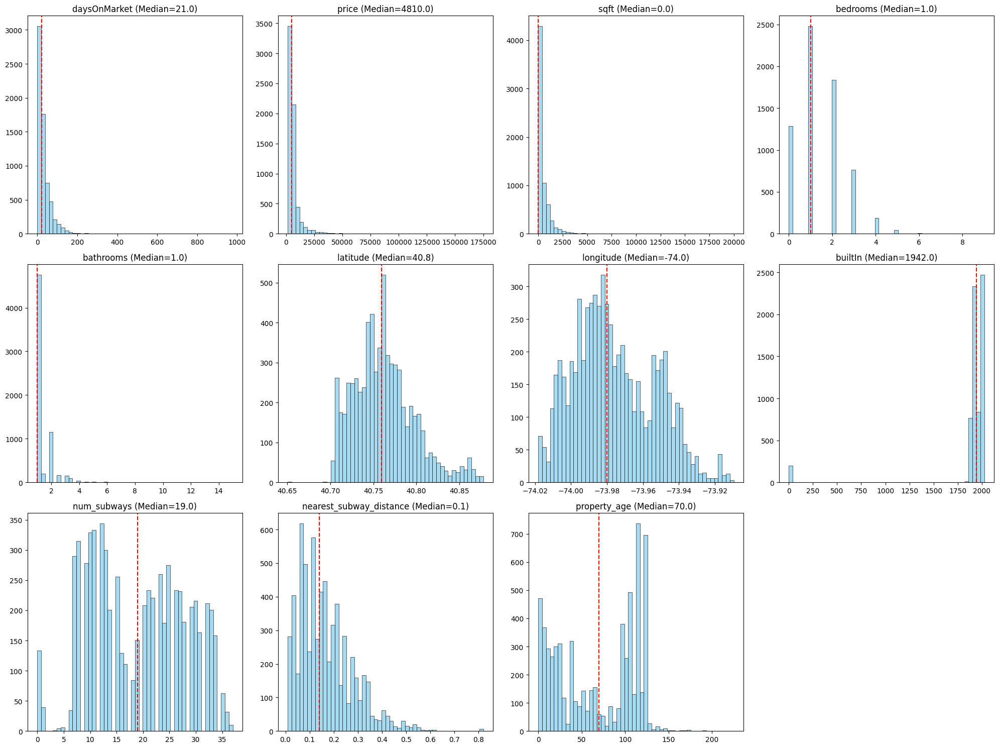

In [51]:
# histograms of all numerical variables

import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(20, 15))  # Adjust figure size

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(3, 4, i)  # 3 rows, 4 columns
    series = df[col].dropna()  # drop missing values
    median_val = series.median()

    sns.histplot(series, bins=50, color='skyblue')
    plt.axvline(median_val, color='red', linestyle='--')
    plt.title(f"{col} (Median={median_val:.1f})")
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

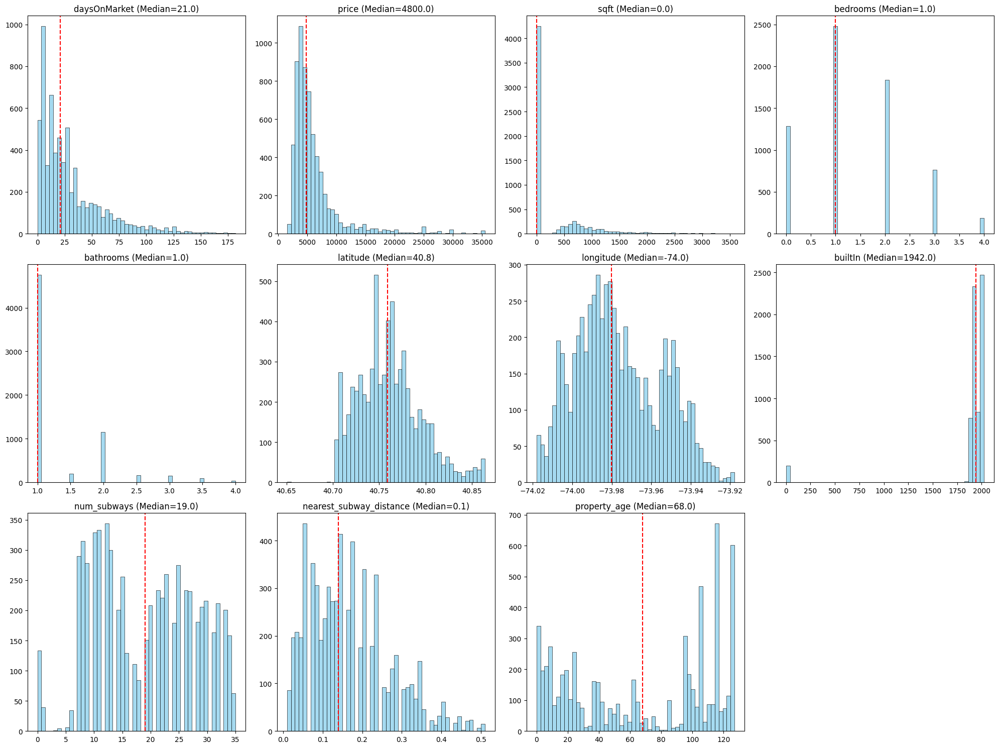

In [52]:
# Some numerical variables show extreme right-tail values (outliers).
# Filter out the extreme upper values (e.g., outside the 99th percentile)
# and replot the histograms to get a better view of the main distribution.

import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(20, 15))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(3, 4, i)
    filtered = df[col][(df[col] <= df[col].quantile(0.99))]
    median_val = filtered.median()
    sns.histplot(filtered, bins=50, color='skyblue')
    plt.axvline(median_val, color='red', linestyle='--')
    plt.title(f"{col} (Median={median_val:.1f})")
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

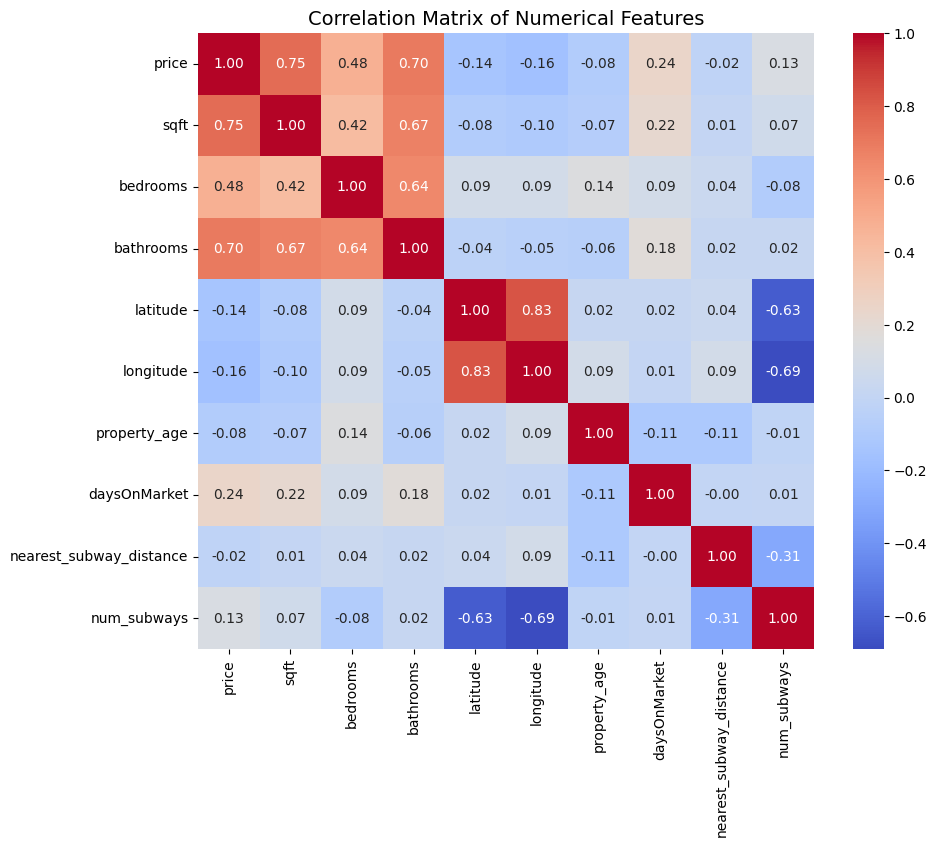

In [53]:
# Select numerical features
num_features = [
    'price', 'sqft', 'bedrooms', 'bathrooms',
    'latitude', 'longitude', 'property_age',
    'daysOnMarket', 'nearest_subway_distance', 'num_subways'
]

# Compute correlation matrix
corr = df[num_features].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Correlation Matrix of Numerical Features", fontsize=14)
plt.show()

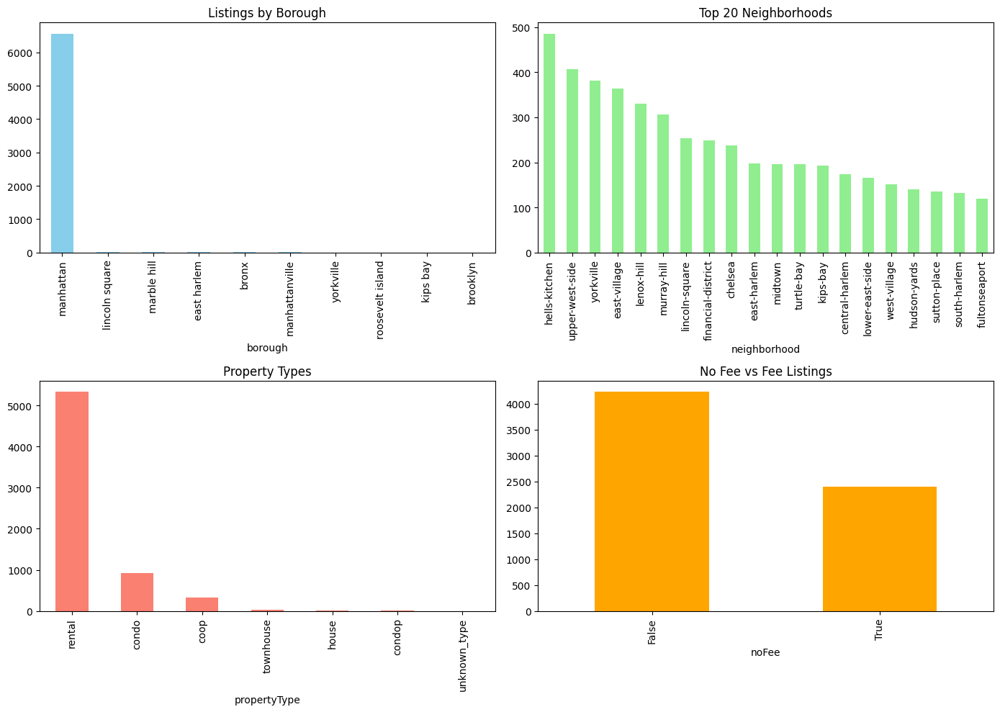

In [54]:
import matplotlib.pyplot as plt

# Create 4 subplots (2 rows x 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Borough distribution
df['borough'].value_counts().plot(kind='bar', ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Listings by Borough')

# Top 20 Neighborhoods
df['neighborhood'].value_counts().head(20).plot(kind='bar', ax=axes[0, 1], color='lightgreen')
axes[0, 1].set_title('Top 20 Neighborhoods')

# Property Type distribution
df['propertyType'].value_counts().plot(kind='bar', ax=axes[1, 0], color='salmon')
axes[1, 0].set_title('Property Types')

# No Fee vs Fee listings
df['noFee'].value_counts().plot(kind='bar', ax=axes[1, 1], color='orange')
axes[1, 1].set_title('No Fee vs Fee Listings')

# Adjust layout
plt.tight_layout()
plt.show()

['manhattan' 'east harlem' 'lincoln square' 'bronx' 'manhattanville'
 'kips bay' 'marble hill' 'yorkville' 'roosevelt island']


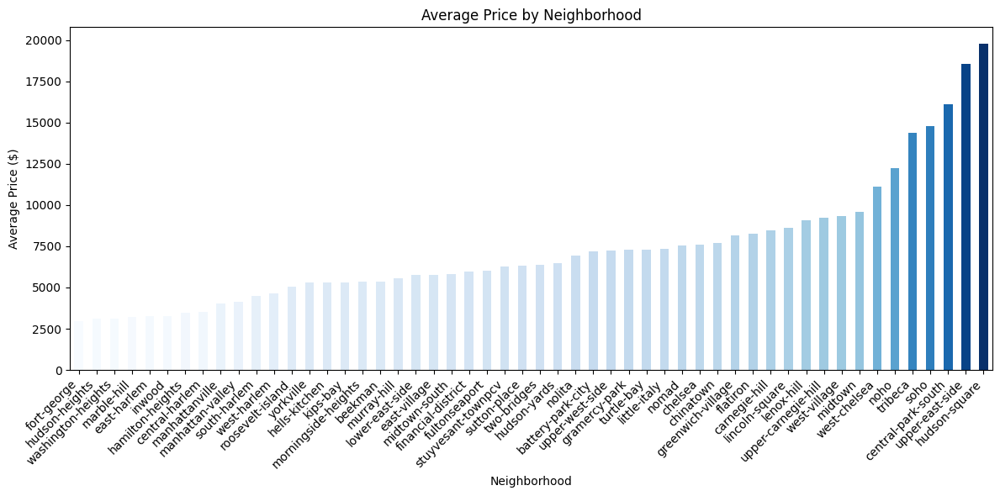

In [55]:
import matplotlib.cm as cm

# filter out brooklyn borough (out of scope)
df = df[~df['borough'].isin(['brooklyn'])]

# print a list of filtered borough
print(df['borough'].unique())

# Compute average price per neighborhood
avg_price = df.groupby('neighborhood')['price'].mean().sort_values(ascending=True)

# Normalize values for colormap
norm = plt.Normalize(avg_price.min(), avg_price.max())
colors = cm.Blues(norm(avg_price.values))

# Plot
plt.figure(figsize=(12, 6))
avg_price.plot(kind='bar', color=colors)
plt.title('Average Price by Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

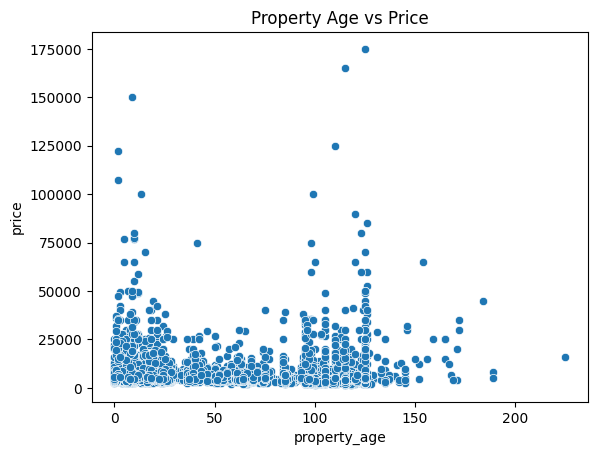

In [56]:
# discover the relationship between property age and price

# Scatter plot
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='property_age', y='price', data=df)
plt.title('Property Age vs Price')
plt.show()

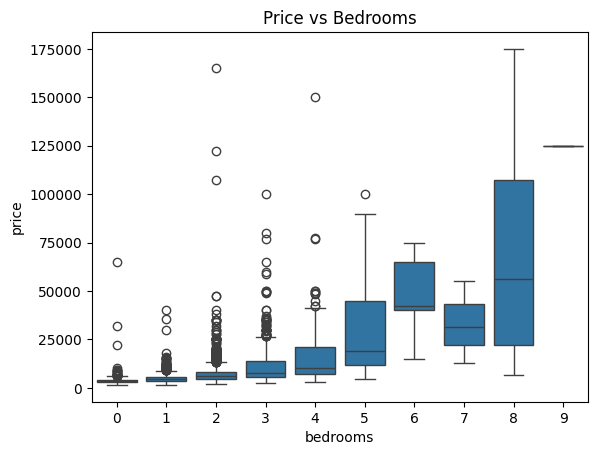

In [57]:
# compare prices between number of bedrooms
sns.boxplot(x='bedrooms', y='price', data=df)
plt.title('Price vs Bedrooms')
plt.show()

## Temporal Analysis

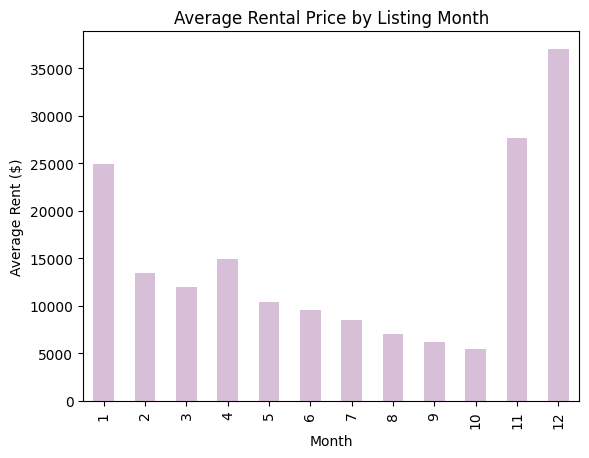

In [58]:
# average price by month

# Compute average price by listing month
avg_price_by_month = df.groupby('listed_month')['price'].mean()

avg_price_by_month.plot(kind='bar', color='thistle')
plt.title('Average Rental Price by Listing Month')
plt.xlabel('Month')
plt.ylabel('Average Rent ($)')
plt.show()

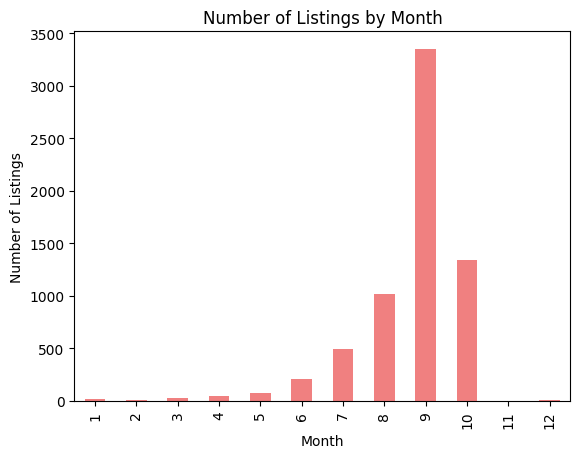

In [59]:
# listing volume by month

# Count listings per month
listings_by_month = df['listed_month'].value_counts().sort_index()

listings_by_month.plot(kind='bar', color='lightcoral')
plt.title('Number of Listings by Month')
plt.xlabel('Month')
plt.ylabel('Number of Listings')
plt.show()

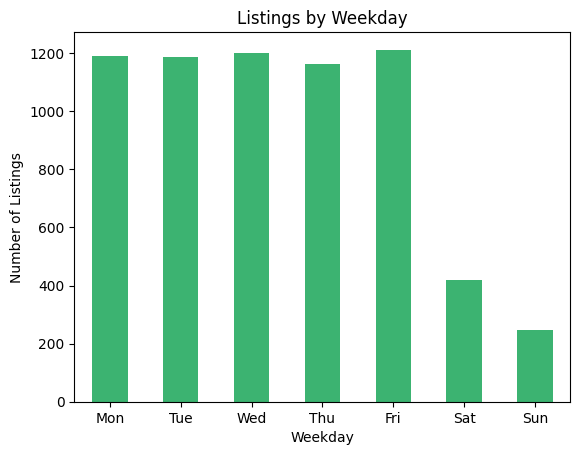

In [60]:
# Weekly patterns for Listing volume

# Count listings per weekday
listings_by_weekday = df['listed_weekday'].value_counts().sort_index()

# map weekday numbers to names
weekday_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

listings_by_weekday.plot(kind='bar', color='mediumseagreen')
plt.title('Listings by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Number of Listings')
plt.xticks(ticks=range(7), labels=weekday_labels, rotation=0)
plt.show()

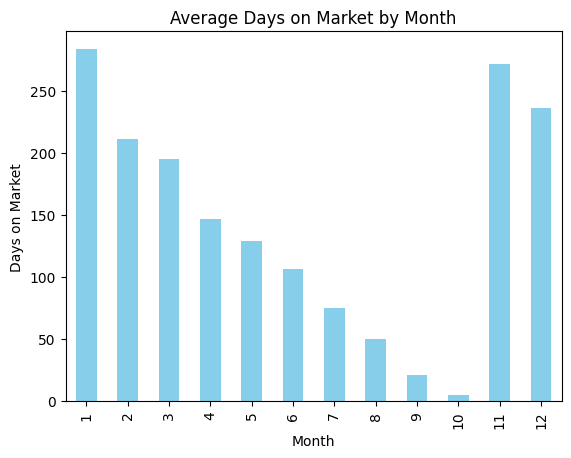

In [61]:
# Days on Market Seasonality Trend

monthly_avg_days = df.groupby('listed_month')['daysOnMarket'].mean()
monthly_avg_days.plot(kind='bar', color='skyblue')
plt.title('Average Days on Market by Month')
plt.xlabel('Month')
plt.ylabel('Days on Market')
plt.show()

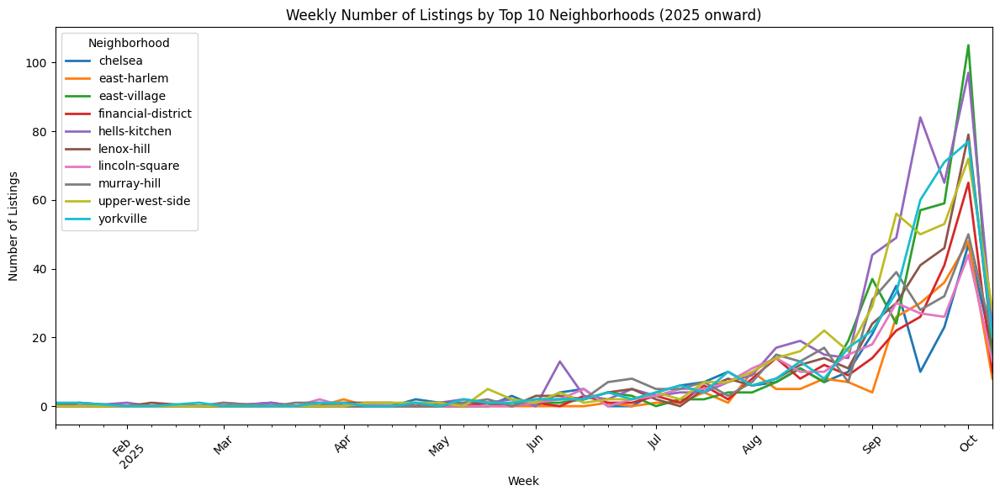

In [62]:
# Listing Trends of the Top 10 Neighborhoods by Volume (2025 Onward)

import matplotlib.pyplot as plt

# Filter for listings from 2025 onward
df_2025 = df[df['listedAt'].dt.year >= 2025]

# Find top 10 neighborhoods by total listings (in 2025)
top_neighborhoods = df_2025['neighborhood'].value_counts().head(10).index

# Compute weekly counts for top neighborhoods
weekly_counts_top = df_2025[df_2025['neighborhood'].isin(top_neighborhoods)] \
    .groupby([df_2025['listedAt'].dt.to_period('W'), 'neighborhood']) \
    .size().unstack(fill_value=0)

# Plot
weekly_counts_top.plot(figsize=(12,6), linewidth=2)
plt.title('Weekly Number of Listings by Top 10 Neighborhoods (2025 onward)')
plt.xlabel('Week')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45)
plt.legend(title='Neighborhood')
plt.tight_layout()
plt.show()

## Some Text Features Analysis

In [63]:
# Text Features Analysis

from collections import Counter

# find the top 30 amenities
all_amenities = df['amenities'].dropna().str.split(', ').sum()
print("Most common amenities: ", Counter(all_amenities).most_common(30))

# find the top 10 subway route
all_routes = df['subway_routes'].dropna().str.split(', ').sum()
print("Most common subway route: ", Counter(all_routes).most_common(10))

Most common amenities:  [('fios_available', 5924), ('pets', 4953), ('dishwasher', 4879), ('elevator', 4743), ('laundry', 4376), ('live_in_super', 4162), ('doorman', 4157), ('hardwood_floors', 4008), ('gym', 3276), ('washer_dryer', 2906), ('bike_room', 2665), ('concierge', 2650), ('package_room', 2518), ('roofdeck', 2503), ('city_view', 2424), ('central_ac', 2046), ('storage_room', 2005), ('smoke_free', 1809), ('recreation_facilities', 1773), ('parking', 1595), ('full_time_doorman', 1548), ('garage', 1427), ('childrens_playroom', 1363), ('media_room', 1348), ('deck', 1302), ('dogs', 1266), ('garden', 1180), ('skyline_view', 981), ('patio', 914), ('pool', 882)]
Most common subway route:  [('B', 5250), ('1', 5054), ('6', 5052), ('Q', 5043), ('C', 5017), ('3', 4932), ('4', 4887), ('5', 4887), ('2', 4869), ('D', 4586)]


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


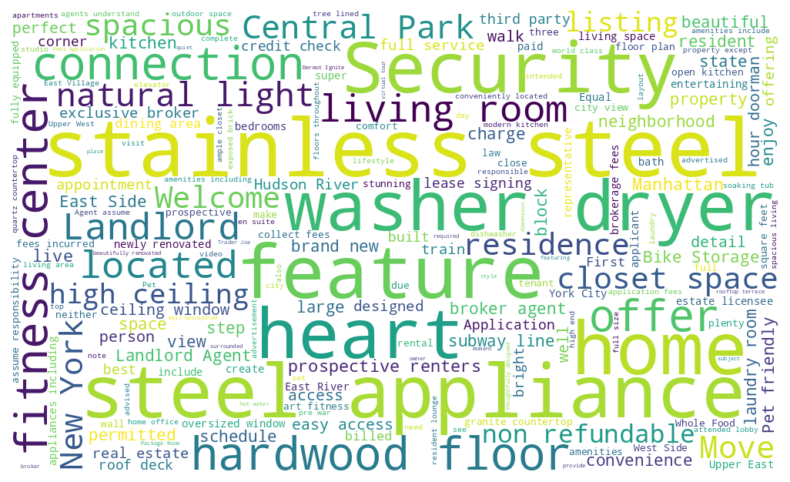

In [64]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords

# Download stopword list
nltk.download('stopwords')
nltk_stopwords = set(stopwords.words('english'))
nltk_stopwords.update([
    'apartment', 'available', 'please', 'contact', 'unit', 'street',
    'rent', 'one', 'two', 'bedroom', 'bathroom', 'building', 'call','fee','per',
    'renter','month','deposit'
])

# Drop missing descriptions
descriptions = df['description'].dropna()

text = " ".join(descriptions)
wordcloud = WordCloud(stopwords=nltk_stopwords, background_color='white', width=1000, height=600).generate(text)

plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Geographic Distribution of Listings

In [66]:
import folium
from folium.plugins import MarkerCluster

# Compute center of the map
nyc_center = [df['latitude'].mean(), df['longitude'].mean()]

# Create map
m = folium.Map(location=nyc_center, zoom_start=12)

# Add clustered markers
marker_cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    popup_text = f"""
    <b>{row['address']}</b><br>
    Neighborhood: {row['neighborhood']}<br>
    Price: ${row['price']:,}<br>
    Bedrooms: {row['bedrooms']}<br>
    Days on Market: {row['daysOnMarket']}
    """
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=4,
        color='blue' if row['price'] < df['price'].median() else 'red',
        fill=True,
        fill_opacity=0.7,
        popup=popup_text
    ).add_to(marker_cluster)

m